# <center>Physics-informed neural network</center>

In [1]:
import torch
from pinn import geometry, pde, neuralnetworks, trainer
from IPython.display import Image

In [2]:
sin, cos, pi = torch.sin, torch.cos, torch.pi

### Ecuación de Poisson 2D en un triángulo

$$
\begin{align*}
\frac{\partial^2 u}{\partial x^2}(x,y) + \frac{\partial^2 u}{\partial y^2}(x,y) & = -10\cos(x+2y), & (x,y)\in[-3, 3]\times[-3, 3]\\
u(x, y) & = 2\cos(x+2y), & (x,y)\in\partial\left([-3, 3]\times[-3, 3]\right)\\
\end{align*}
$$

100%|██████████| epoch 20 of 20 ( 5.65epochs/s) | loss: 0.0000 | training time: 00:03


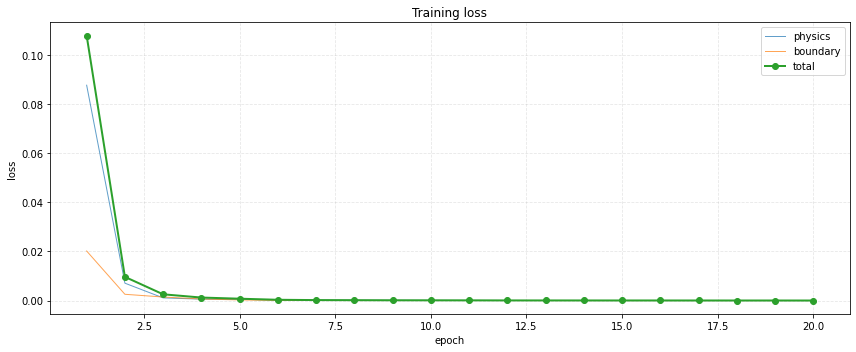

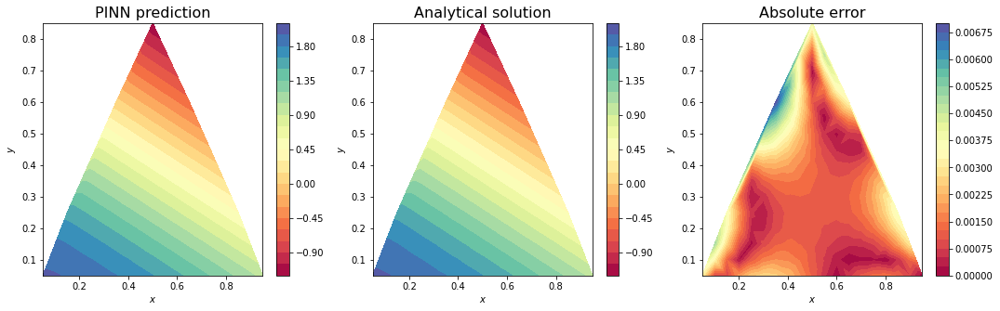

In [3]:
class PoissonEquation(pde.BaseClass):
    
    def __init__(self):
        super().__init__()
        self.domain = geometry.Domain('polygon', vertices=torch.tensor([[0.,0], [1, 0], [1/2, 0.86]]))
        self.equation = self.eq
        self.boundary_condition = {'res': self.bc}
        self.analytical_solution = self.solution
    
    def eq(self, data, solution):
        x, y = data['x'], data['y']
        u = solution[0]
        u_x = self.d(u, x)
        u_y = self.d(u, y)
        u_xx = self.d(u_x, x)
        u_yy = self.d(u_y, y)
        lado_derecho = -10*cos(x + 2*y)
        eq = u_xx + u_yy - lado_derecho
        return (eq, )

    def bc(self, data, normals, solution):
        x, y = data['x'], data['y']
        u = solution[0]
        bc = u - 2*cos(x + 2*y)
        return (bc, )

    def solution(self, data):
        x, y = data['x'], data['y']
        sol = 2*cos(x + 2*y)
        return (sol, )

# Objects:
eq = PoissonEquation()
net = neuralnetworks.FullyConnected(n_variables=2, n_output=1, n_layers=3, wide=100)
optimizer = torch.optim.LBFGS(net.parameters(), line_search_fn='strong_wolfe')
tr = trainer.Trainer(eq, net, optimizer)

# Training:
tr.train(epochs=20)#, calculate_confidence=True)
#net.condifence_interval({'x': torch.tensor([0.3]), 'y': torch.tensor([0.3])})

tr.plot_loss()
net.plot_pinn(eq)

### Ecuación del calor 2D con condiciones de borde Neumann en un pentágono

$$
\begin{align*}
\frac{\partial u}{\partial t}(x,y,t) - \Delta u(x,y,t) & = 1 + 2x(x+y-1), & t\in[2, 5], & \quad x\in\Omega\\
u(x, y, 0) & = x^2 (1/2 - x/3) + y^2 (1/2 - y/3), & & \quad  x\in\Omega\\
\frac{\partial u}{\partial n}(x,y,t) &= 0, &  t\in[0, 1], & \quad x\in\partial\Omega\\
\end{align*}
$$

100%|██████████| epoch 100 of 100 ( 2.04epochs/s) | loss: 2.9783 | training time: 00:49


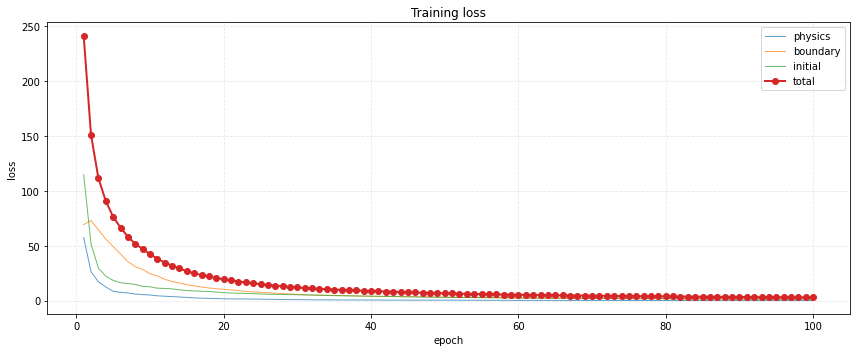

Generating animation...
Simulation saved as pinn.gif.


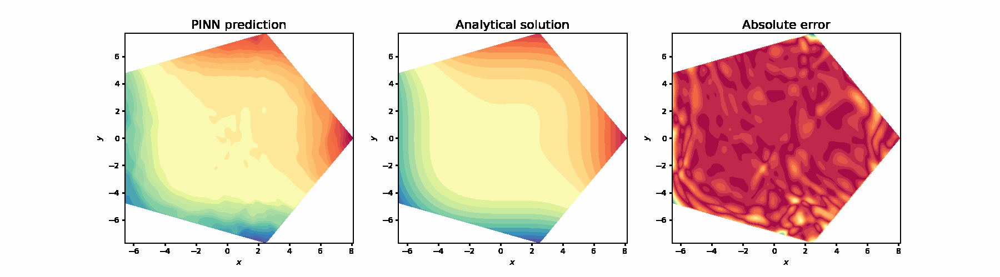

In [4]:
class HeatEquation(pde.BaseClass):
    
    def __init__(self):
        super().__init__()

        pentagon_vertices = [(8.1*cos(torch.tensor(k*2*pi/5)), 8.1*sin(torch.tensor(k*2*pi/5))) for k in range(5)]
        self.domain = geometry.Domain('polygon', temporal_domain=[2, 5], vertices=torch.tensor(pentagon_vertices))
        self.equation = self.eq
        self.boundary_condition = {'res': self.bc}
        self.analytical_solution = self.solution
        self.initial_condition = self.ic
    
    def eq(self, data, solution):
        x, y, t = data['x'], data['y'], data['t']
        u = solution[0]
        u_t = self.d(u, t)
        u_x = self.d(u, x)
        u_y = self.d(u, y)
        u_xx = self.d(u_x, x)
        u_yy = self.d(u_y, y)
        lado_derecho = 1 + 2*(x + y -1)
        eq = u_t - u_xx - u_yy - lado_derecho
        return (eq, )

    def bc(self, data, normals, solution):
        x, y, t = data['x'], data['y'], data['t']
        u = solution[0]
        u_d = self.d_n(u, data, normals)
        bc = u_d - 0
        return (bc, )
    
    def ic(self, data, solution):
        x, y, t = data['x'], data['y'], data['t']
        u = solution[0]
        ic = u - (x**2 * (1/2 - x/3) + y**2 * (1/2 - y/3))
        return (ic, )

    def solution(self, data):
        x, y, t = data['x'], data['y'], data['t']
        sol = x**2 * (1/2 - x/3) + y**2 * (1/2 - y/3) + t
        return (sol, )

# Objects:
eq = HeatEquation()
net = neuralnetworks.FullyConnected(n_variables=3, n_output=1, n_layers=3, wide=100)
optimizer = torch.optim.LBFGS(net.parameters())
tr = trainer.Trainer(eq, net, optimizer)

# Training:
tr.train(epochs=100)
tr.plot_loss()
net.plot_pinn(eq)
Image('pinn.gif', retina=True)

### Ecuación de ondas 1D en un intervalo

$$
\begin{align*}
\frac{\partial^2 u}{\partial t^2}(x,t) - \frac{\partial^2 u}{\partial x^2}(x,t) & = 0, & t\in[0, 5], & \quad x\in[-\pi, \pi]\\
u(x, 0) & = x^2, & & \quad  x\in[-\pi, \pi]\\
u_t(x, 0) & = -2x, & & \quad  x\in[-\pi, \pi]\\
u(x, t) & = (x-t)^2 &  t\in[0, 5], & \quad x\in\partial[-\pi, \pi]\\
\end{align*}
$$

100%|██████████| epoch 20 of 20 ( 4.14epochs/s) | loss: 0.0003 | training time: 00:04


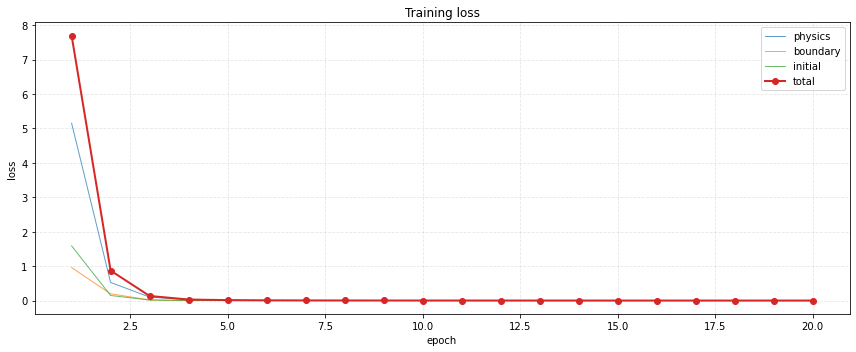

Generating animation...
Simulation saved as pinn.gif.


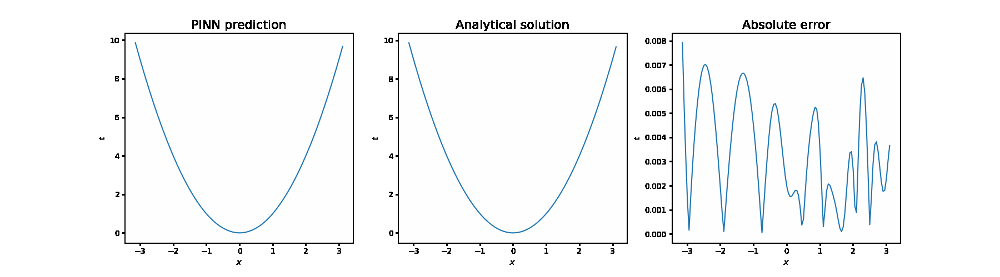

In [5]:
class WaveEquation(pde.BaseClass):
    
    def __init__(self):
        super().__init__()
        self.domain = geometry.Domain('interval', temporal_domain=[0, 5], a=-pi, b=pi)
        self.equation = self.eq
        self.boundary_condition = {'res': self.bc}
        self.initial_condition = self.ic
        self.analytical_solution = self.solution
        
    def eq(self, data, solution):
        x, t = data['x'], data['t']
        u = solution[0]
        u_t = self.d(u, t)
        u_x = self.d(u, x)
        u_xx = self.d(u_x, x)
        u_tt = self.d(u_t, t)
        eq = u_tt - u_xx
        return (eq, )

    def bc(self, data, normals, solution):
        x, t = data['x'], data['t']
        u = solution[0]
        bc = u - (x-t)**2
        return (bc, )
    
    def ic(self, data, solution):
        x, t = data['x'], data['t']
        u = solution[0]
        ic1 = u - x**2
        ic2 = self.d(u, t) + 2*x
        return (ic1, ic2)

    def solution(self, data):
        x, t = data['x'], data['t']
        sol = (x-t)**2
        return (sol, )

# Objects:
eq = WaveEquation()
net = neuralnetworks.FullyConnected(n_variables=2, n_output=1, n_layers=3, wide=100)
optimizer = torch.optim.LBFGS(net.parameters())
tr = trainer.Trainer(eq, net, optimizer)

# Training:
tr.train(epochs=20)
tr.plot_loss()
net.plot_pinn(eq)
Image('pinn.gif', retina=True)

### Sistema de 2 ecuaciones 2D no temporales en un rectángulo

$$
\begin{align*}
\Delta u(x,y) + v(x, y) &= -2\cos(x+y) + x\cos(x) + y & (x,y)\in\left([-5, 5]\times[-5, 5]\right)\\
\frac{\partial u}{\partial x}(x,y) - \Delta v(x,y) &= -\sin(x+y) - y + 2\sin(x) + x\cos(x),  & (x,y)\in\left([-5, 5]\times[-5, 5]\right)\\
u(x, y) & = \cos(x+y) - xy, & (x,y)\in\partial\left([-5, 5]\times[-5, 5]\right)\\
v(x, y) & = x\cos(x) + y, & (x,y)\in\partial\left([-5, 5]\times[-5, 5]\right)\\
\end{align*}
$$

100%|██████████| epoch 50 of 50 ( 4.07epochs/s) | loss: 0.0003 | training time: 00:12


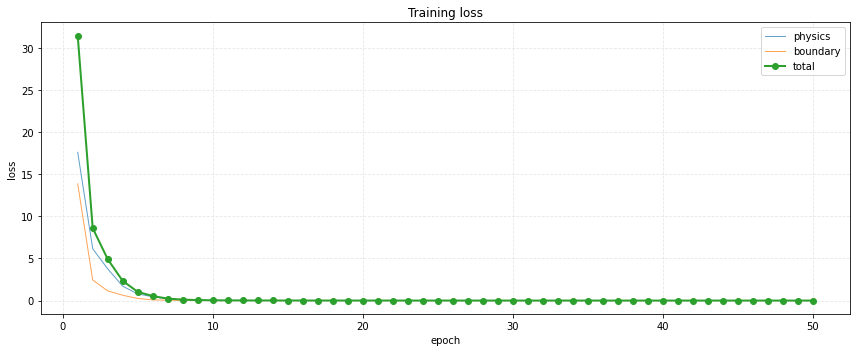

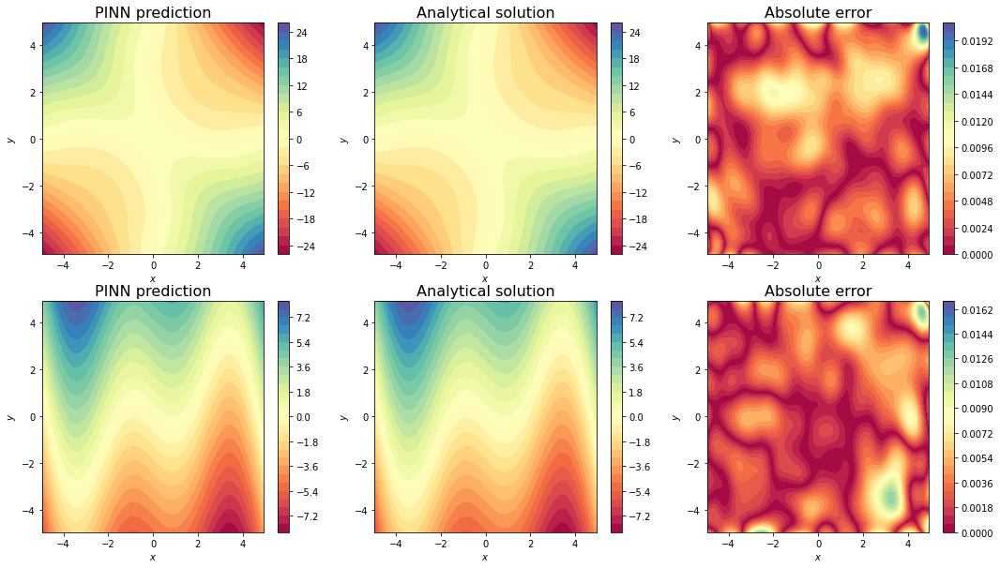

In [6]:
class CoupledSystem(pde.BaseClass):
    
    def __init__(self):
        super().__init__()

        self.domain = geometry.Domain('polygon', vertices=torch.tensor([[-5, -5], [5, -5], [5, 5], [-5, 5]]))
        self.equation = self.eq
        self.boundary_condition = {'res': self.bc}
        self.analytical_solution = self.solution
    
    def eq(self, data, solution, **kwargs):
        u, v = solution
        x, y = data['x'], data['y']
        u_x = self.d(u, x)
        u_xx = self.d(u_x, x)
        u_y = self.d(u, y)
        u_yy = self.d(u_y, y)
        v_x = self.d(v, x)
        v_xx = self.d(v_x, x)
        v_y = self.d(v, y)
        v_yy = self.d(v_y, y)
        eq1 = u_xx + u_yy + v - (-2*cos(x+y) + x*cos(x) + y)
        eq2 = u_x - v_xx - v_yy - (-sin(x+y) - y + 2*sin(x) + x*cos(x))
        return (eq1, eq2)

    def bc(self, data, normals, solution):
        u, v = solution
        x, y = data['x'], data['y']
        bc1 = u - cos(x+y) + x*y
        bc2 = v - x*cos(x) - y
        return (bc1, bc2)

    def solution(self, data):
        x, y = data['x'], data['y']
        sol1 = cos(x+y) - x*y
        sol2 = x*cos(x) + y
        return (sol1, sol2)

# Objects:
eq = CoupledSystem()
net = neuralnetworks.FullyConnected(n_variables=2, n_output=2, n_layers=3, wide=100)
optimizer = torch.optim.LBFGS(net.parameters())
tr = trainer.Trainer(eq, net, optimizer)

# Training:
tr.train(epochs=50)
tr.plot_loss()
net.plot_pinn(eq)

### Sistema de 2 ecuaciones 2D temporales

$$
\begin{align*}
\frac{\partial u}{\partial t}(x,t) + \frac{\partial v}{\partial x}(x, t) &= x+t-\sin(x) & (x,t)\in\left([0, 2\pi]\times[0, 1]\right)\\
\frac{\partial v}{\partial t}(x,t) + \frac{\partial u}{\partial x}(x, t) &= x+t+\cos(x),  & (x,t)\in\left([0, 2\pi]\times[0, 1]\right)\\
u(x, t) & = \sin(x) + tx, & (x,y)\in\partial\left([0, 2\pi]\times[0, 1]\right)\\
v(x, t) & = \cos(x) + tx, & (x,y)\in\partial\left([0, 2\pi]\times[0, 1]\right)\\
u(x, 0) & = \sin(x)
\end{align*}
$$

100%|██████████| epoch 50 of 50 ( 6.47epochs/s) | loss: 0.0001 | training time: 00:07


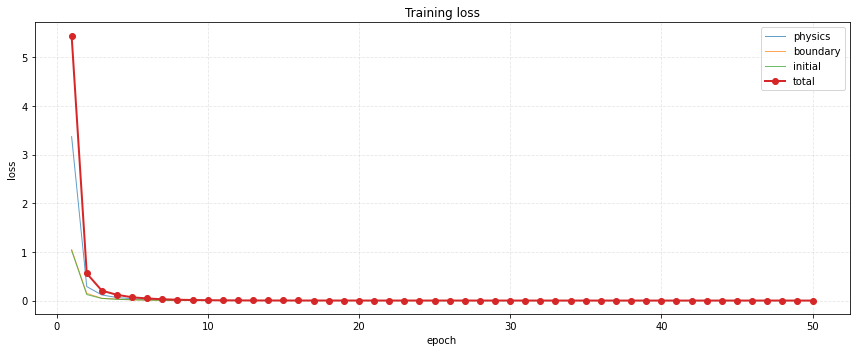

Generating animation...
Simulation saved as pinn.gif.


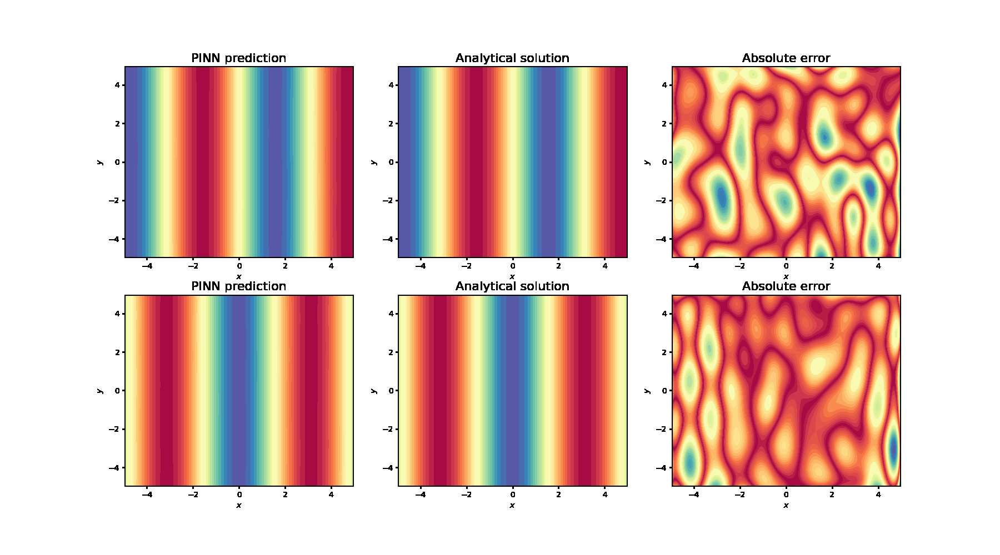

In [7]:
class TemporalCoupledSystem(pde.BaseClass):
    
    def __init__(self):
        super().__init__()
        self.domain = geometry.Domain('polygon', temporal_domain=[0,1], vertices=torch.tensor([[-5, -5], [5, -5], [5, 5], [-5, 5]]))
        self.equation = self.eq
        self.boundary_condition = {'res': self.bc}
        self.initial_condition = self.ic
        self.analytical_solution = self.solution
    
    def eq(self, data, solution):
        u, v = solution
        x, t = data['x'], data['t']
        u_t = self.d(u, t)
        u_x = self.d(u, x)
        v_t = self.d(v, t)
        v_x = self.d(v, x)
        eq1 = u_t + v_x  - (x + t - sin(x))
        eq2 = v_t + u_x  - (x + t + cos(x))
        return (eq1, eq2)

    def bc(self, data, normals, solution):
        u, v = solution
        x, t = data['x'], data['t']
        bc1 = u - (sin(x) + t*x)
        bc2 = v - (cos(x) + t*x)
        return (bc1, bc2)
    
    def ic(self, data, solution):
        u, v = solution
        x, t = data['x'], data['t']
        ic1, ic2 = (u - (sin(x) + t*x)), (v - (cos(x) + t*x))
        return (ic1, ic2)

    def solution(self, data):
        x, t = data['x'], data['t']
        sol1 = sin(x) + t*x
        sol2 = cos(x) + t*x
        return (sol1, sol2)

# Objects:
eq = TemporalCoupledSystem()
net = neuralnetworks.FullyConnected(n_variables=3, n_output=2, n_layers=3, wide=100)
optimizer = torch.optim.LBFGS(net.parameters())
tr = trainer.Trainer(eq, net, optimizer)

# Training:
tr.train(epochs=50)
tr.plot_loss()
net.plot_pinn(eq)
Image('pinn.gif', retina=True)

### Ecuación de Poisson como problema inverso

$$
\nabla\cdot\left(\gamma(x,y) \nabla u(x,y)\right) = -5(\sin(xy)+2)\cos(x+2y) - (2x+y)\sin(x+2y)\cos(xy),
\qquad (x,y)\in[-\pi, \pi]\times[-\pi, \pi]
$$

donde $\gamma(x,y)$ es desconocido.

100%|██████████| epoch 300 of 300 ( 1.20epochs/s) | loss: 0.0000 | training time: 04:09


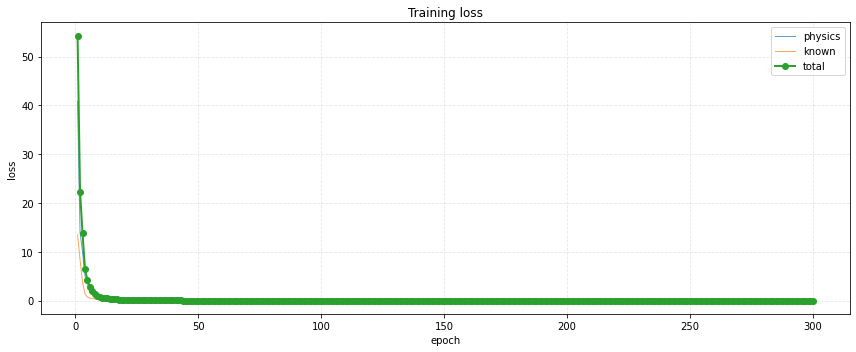

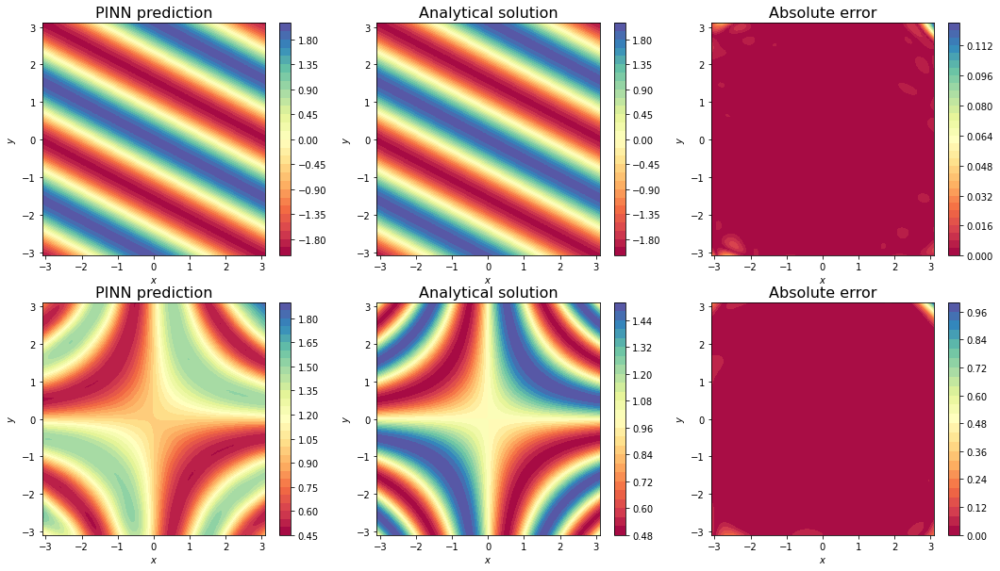

In [14]:
class InversePoissonEquation(pde.BaseClass):
    
    def __init__(self):
        super().__init__()
        self.domain = geometry.Domain('polygon', vertices=torch.tensor([[-pi, -pi], [pi, -pi], [pi, pi], [-pi, pi]]))
        self.equation = self.eq
        self.known_solution = self.known
        self.analytical_solution = self.solution
    
    def eq(self, data, solution):
        u, gamma = solution
        x, y = data['x'], data['y']
        u_x = self.d(u, x)
        u_xx = self.d(u_x, x)
        u_y = self.d(u, y)
        u_yy = self.d(u_y, y)
        gamma_x = self.d(gamma, x)
        gamma_y = self.d(gamma, y)
        f = -5 * (sin(x*y)+2) * cos(x+2*y) - (2*x+y) * sin(x+2*y) * cos(x*y)
        eq = gamma * (u_xx + u_yy) + gamma_x * u_x + gamma_y * u_y - f
        return (eq, )

    def known(self, data):
        x, y = data['x'], data['y']
        sol_u = 2*cos(x + 2*y)
        return (sol_u, None)
    
    def solution(self, data):
        x, y = data['x'], data['y']
        sol_u = 2*cos(x + 2*y)
        sol_gamma = 1 + 1/2 * sin(x*y)
        return (sol_u, sol_gamma)

# Objects:
eq = InversePoissonEquation()
net = neuralnetworks.FullyConnected(n_variables=2, n_output=2, n_layers=5, wide=250)
optimizer = torch.optim.LBFGS(net.parameters())
tr = trainer.Trainer(eq, net, optimizer)

# Training:
tr.train(epochs=300)
tr.plot_loss()
net.plot_pinn(eq)

### Ecuación de Burgers

$$
\begin{align*}
\frac{\partial u}{\partial t}(x,t) + u(x,t)\cdot\frac{\partial u}{\partial x}(x,t) - \nu\frac{\partial^2 u}{\partial x^2}(x,t) & = \cos(x+t) (1 + \nu t) - t\sin(x+t)\left(t\cos(x+t)+1\right), & t\in[0, 1], & \quad x\in[0, 2\pi]\\
u(x, 0) & = 0, & & \quad  x\in[0, 2\pi]\\
u(x, t) & = t\cos(x+t), &  t\in[0, 1], & \quad x\in\partial[0, 2\pi]\\
\end{align*}
$$

100%|██████████| epoch 20 of 20 (16.05epochs/s) | loss: 0.0004 | training time: 00:01


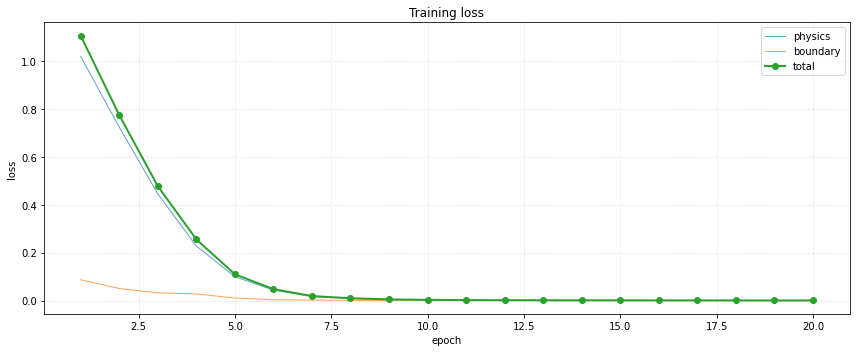

Generating animation...
Simulation saved as pinn.gif.


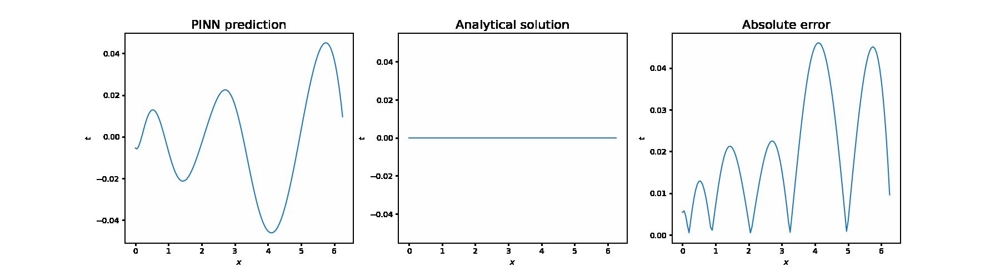

In [9]:
class BurgersEquation(pde.BaseClass):
    
    def __init__(self):
        super().__init__()
        self.domain = geometry.Domain('interval', temporal_domain=[0., 2], a=0., b=2*pi)
        self.equation = self.eq
        self.boundary_condition = {'res': self.bc}
        self.initial_condition = self.ic
        self.analytical_solution = self.solution
        
    def eq(self, data, solution):
        u = solution[0]
        x, t = data['x'], data['t']
        DIFFUSION = 0.1
        u_t = self.d(u, t)
        u_x = self.d(u, x)
        u_xx = self.d(u_x, x)
        lado_derecho = cos(x+t) * (1 + DIFFUSION*t) - t * sin(x+t) * (t*cos(x+t) + 1)
        eq = u_t  + u * u_x - DIFFUSION * u_xx - lado_derecho
        return (eq, )

    def bc(self, data, normals, solution):
        u = solution[0]
        x, t = data['x'], data['t']
        bc = u - t * cos(x+t)
        return (bc, )
    
    def ic(self, data, solution):
        u = solution[0]
        x, t = data['x'], data['t']
        ic = 0 + 0*x
        return (ic, )

    def solution(self, data):
        x, t = data['x'], data['t']
        sol = t * cos(x+t)
        return (sol, )

# Objects:
eq = BurgersEquation()
net = neuralnetworks.FullyConnected(n_variables=2, n_output=1, n_layers=2, wide=100)
optimizer = torch.optim.LBFGS(net.parameters())
tr = trainer.Trainer(eq, net, optimizer)

# Training:
tr.train(epochs=20)
tr.plot_loss()
net.plot_pinn(eq)
Image('pinn.gif', retina=True)

### Ecuación de Korteweg-de Vries

$$
\begin{align*}
\frac{\partial u}{\partial t}(x,t) + u(x,t)\cdot\frac{\partial u}{\partial x}(x,t) - \mu\frac{\partial^3 u}{\partial x^3}(x,t) & = \sin(2t) - 2\cos(x)\sin(x) \left(4\mu + \cos^2(x) + \sin^2(t)\right), & t\in[0, 5], & \quad x\in[-\pi, \pi]\\
u(x, 0) & = \cos^2(x), & & \quad  x\in[-\pi, \pi]\\
u(x, t) & = \cos^2(x) + \sin^2(t), &  t\in[0, 5], & \quad x\in\partial[-\pi, \pi]\\
\end{align*}
$$

  8%|▊         | epoch 17 of 200 ( 3.40epochs/s) | loss: 0.0992 | training time: 00:04

Training interrupted at epoch 17.


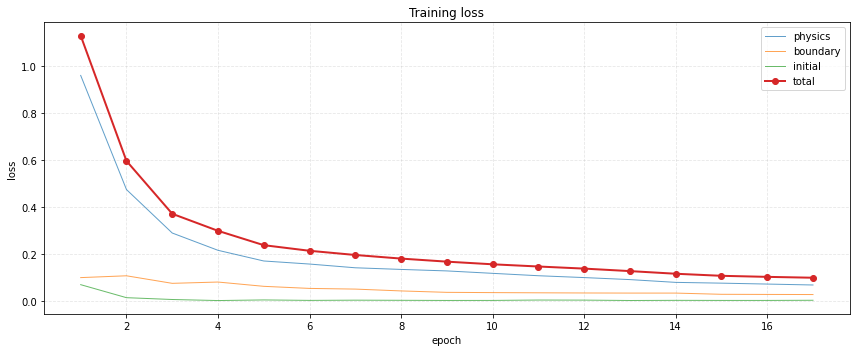

Generating animation...
Simulation saved as pinn.gif.


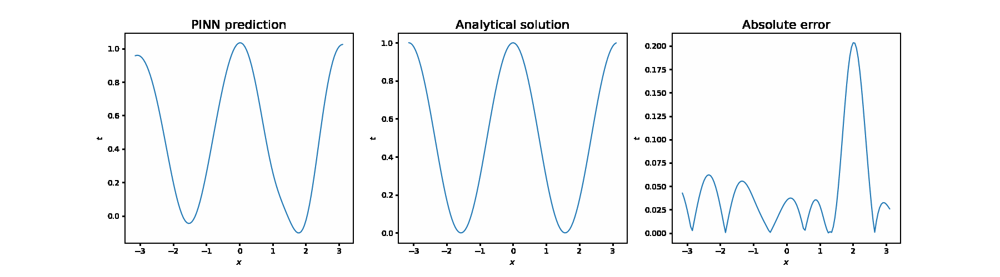

In [10]:
class KdVEquation(pde.BaseClass):
    
    def __init__(self):
        super().__init__()
        self.domain = geometry.Domain('interval', temporal_domain=[0., 5], a=-pi, b=pi)
        self.equation = self.eq
        self.boundary_condition = {'res': self.bc}
        self.initial_condition = self.ic
        self.analytical_solution = self.solution
        
    def eq(self, data, solution):
        u = solution[0]
        x, t = data['x'], data['t']
        MU = 0.1
        u_t = self.d(u, t)
        u_x = self.d(u, x)
        u_xx = self.d(u_x, x)
        u_xxx = self.d(u_xx, x)
        lado_derecho = sin(2*t) - 2*cos(x)*sin(x) * (4*MU + cos(x)**2 + sin(x)**2)
        eq = u_t  + u * u_x - MU * u_xxx - lado_derecho
        return (eq, )

    def bc(self, data, normals, solution):
        u = solution[0]
        x, t = data['x'], data['t']
        u_x = self.d(u, x)
        bc1 = u - cos(x)**2 - sin(x)**2
        bc2 = u_x + 2*cos(x) * sin(x)
        return (bc1, bc2)
    
    def ic(self, data, solution):
        u = solution[0]
        x, t = data['x'], data['t']
        ic = u - cos(x)**2
        return (ic, )

    def solution(self, data):
        x, t = data['x'], data['t']
        sol = cos(x)**2 + sin(t)**2
        return (sol, )

# Objects:
eq = KdVEquation()
net = neuralnetworks.FullyConnected(n_variables=2, n_output=1, n_layers=4, wide=80)
optimizer = torch.optim.LBFGS(net.parameters())
tr = trainer.Trainer(eq, net, optimizer)

# Training:
tr.train(epochs=200)
tr.plot_loss()
net.plot_pinn(eq)
Image('pinn.gif', retina=True)